### Crop Pest and Disease

## Import Library & Dataset

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import os
import seaborn as sns
import cv2
from PIL import Image, UnidentifiedImageError, ImageEnhance, ImageFile
ImageFile.LOAD_TRUNCATED_IMAGES = False
from pathlib import Path
from collections import Counter, defaultdict
import hashlib
import shutil
from tqdm import tqdm
import random
import tensorflow as tf
from tensorflow.keras.applications.densenet import DenseNet121, preprocess_input
from tensorflow.keras import layers, models
from sklearn.utils.class_weight import compute_class_weight
from sklearn.metrics import classification_report, confusion_matrix
from tensorflow.keras.applications import DenseNet121
from tensorflow.keras.layers import Dense, GlobalAveragePooling2D, Dropout
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import Adam

In [2]:
data_path = Path("crop_pest_and_disease")  
valid_exts = (".png", ".jpg", ".jpeg")

classes = sorted([d.name for d in data_path.iterdir() if d.is_dir()])
print(f"Total kelas: {len(classes)}")
print("Daftar kelas:", classes[:10])

Total kelas: 22
Daftar kelas: ['Cashew anthracnose', 'Cashew gumosis', 'Cashew healthy', 'Cashew leaf miner', 'Cashew red rust', 'Cassava bacterial blight', 'Cassava brown spot', 'Cassava green mite', 'Cassava healthy', 'Cassava mosaic']


In [3]:
def count_total_images(folder_path):
    total = 0
    per_kelas = {}

    # Loop subfolder
    for class_name in os.listdir(folder_path):
        class_folder = os.path.join(folder_path, class_name)

        if os.path.isdir(class_folder):
            # Count file per class
            jumlah_gambar = len([
                f for f in os.listdir(class_folder)
                if f.lower().endswith(('.jpg', '.jpeg', '.png'))
            ])
            per_kelas[class_name] = jumlah_gambar
            total += jumlah_gambar

    return total, per_kelas

In [4]:
total_images, image_per_class = count_total_images(data_path)
print(f"Total gambar: {total_images}")

Total gambar: 25220


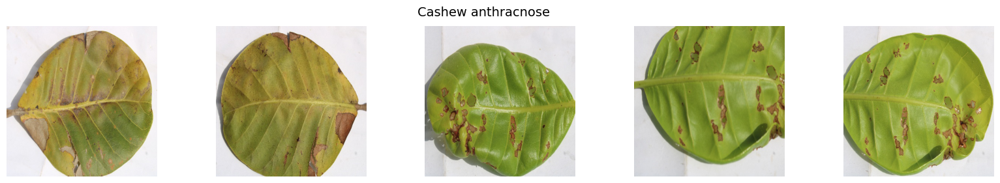

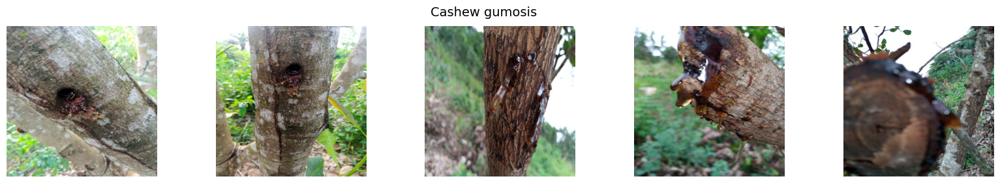

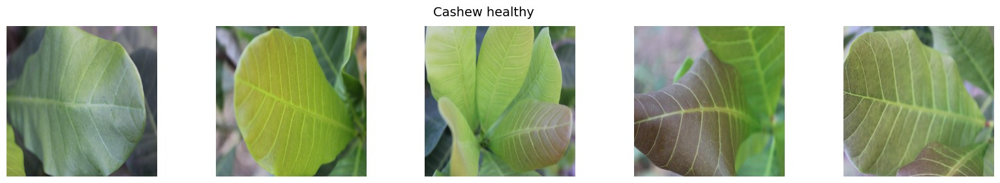

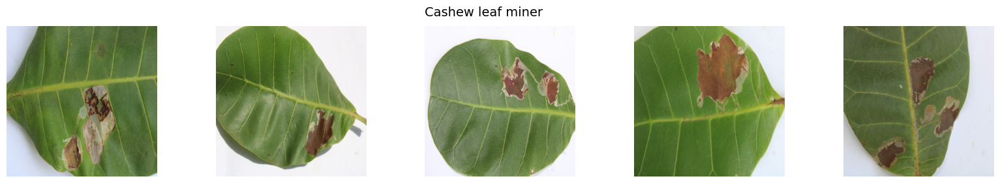

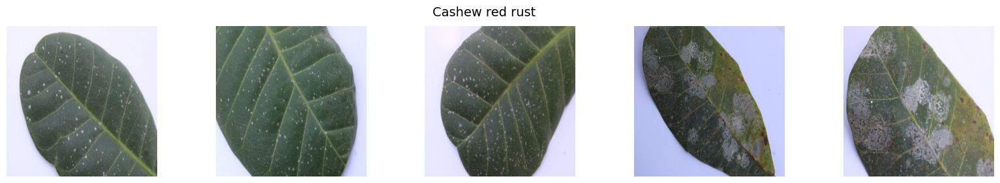

...

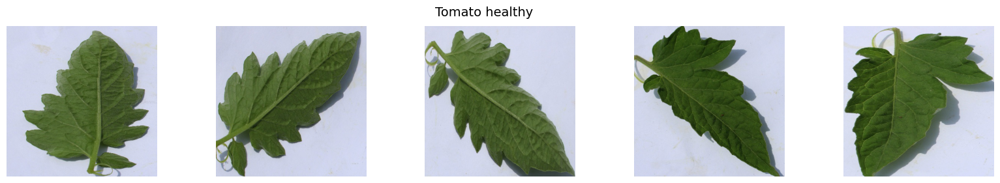

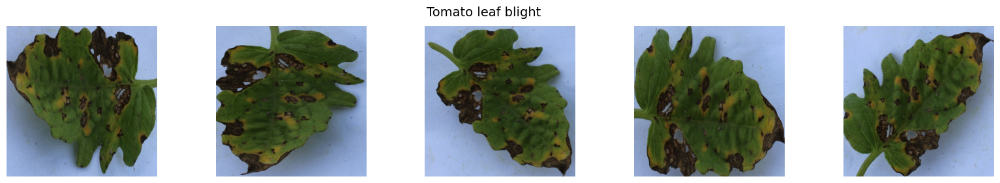

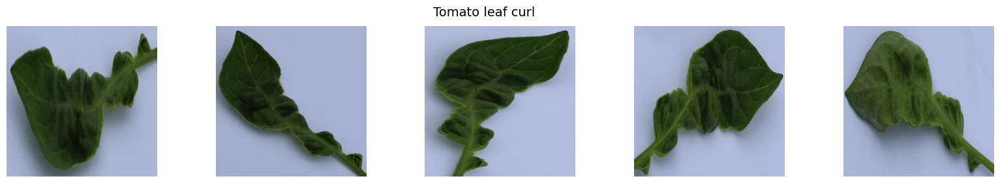

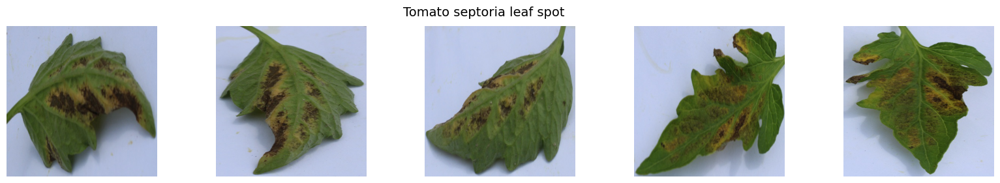

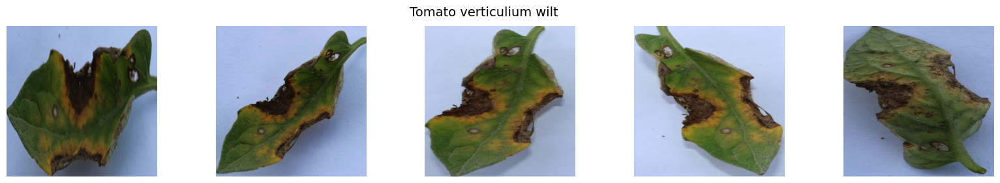

In [5]:
for class_name in classes:
    img_files = list((data_path / class_name).glob("*.[jp][pn]g"))  # jpg/png/jpeg
    sample_files = img_files[:5]

    plt.figure(figsize=(20, 3))
    plt.suptitle(class_name, fontsize=14)

    for i, img_path in enumerate(sample_files):
        img = Image.open(img_path)
        plt.subplot(1, 5, i + 1)
        plt.imshow(img)
        plt.axis("off")
    plt.show()

## Exploratory Data Analysis


#### 1. Class Distribution & Imbalance

In [7]:
print("Total images per class:")
print(f"{'Kelas':<36} | {'Jumlah Gambar':>14}")
print("-" * 53)

for nama_kelas, jumlah in sorted(image_per_class.items()):
    print(f"{nama_kelas:<36} : {jumlah:>14}")

Total images per class:
Kelas                                |  Jumlah Gambar
-----------------------------------------------------
Cashew anthracnose                   :           1729
Cashew gumosis                       :            392
Cashew healthy                       :           1368
Cashew leaf miner                    :           1378
Cashew red rust                      :           1682
Cassava bacterial blight             :           2614
Cassava brown spot                   :           1481
Cassava green mite                   :           1015
Cassava healthy                      :           1193
Cassava mosaic                       :           1205
Maize fall armyworm                  :            285
Maize grasshoper                     :            673
Maize healthy                        :            208
Maize leaf beetle                    :            948
Maize leaf blight                    :           1006
Maize leaf spot                      :           1259
Maiz

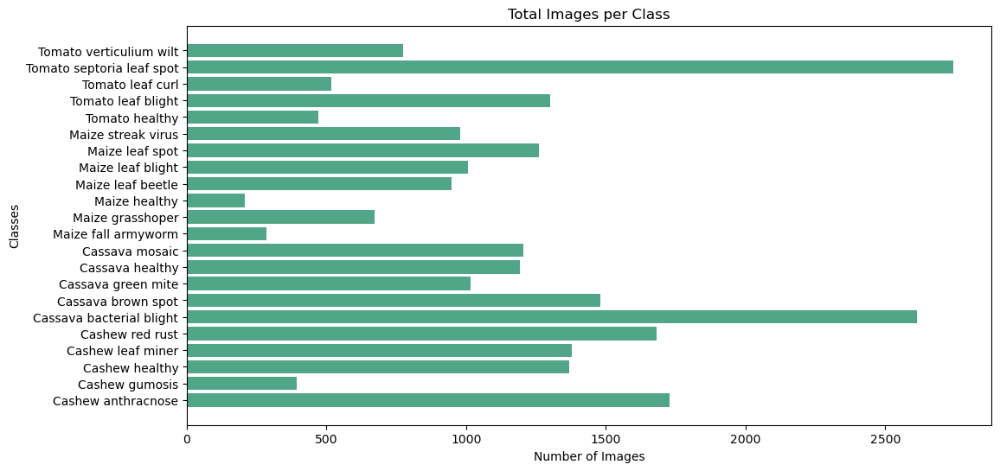

In [8]:
plt.figure(figsize=(12,6))
plt.barh(list(image_per_class.keys()), list(image_per_class.values()), color="#51A687")
plt.xlabel("Number of Images")
plt.ylabel("Classes")
plt.title("Total Images per Class")
plt.show()

#### 2. Check Duplicate Images

##### 2.1 Same Class

In [9]:
def get_hash(image_path):
    try:
        with Image.open(image_path) as img:
            img = img.convert("RGB")
            return hashlib.md5(img.tobytes()).hexdigest()
    except Exception:
        return None

In [10]:
seen_hashes = defaultdict(dict)
duplicates = defaultdict(list)

for root, _, files in os.walk(data_path):
    if not files:
        continue

    class_name = os.path.basename(root)
    for file in files:
        if file.lower().endswith(('.png', '.jpg', '.jpeg')):
            path = os.path.join(root, file)
            h = get_hash(path)
            if h is None:
                continue

            # Simpan hash per class
            if h in seen_hashes[class_name]:
                duplicates[class_name].append(path)
            else:
                seen_hashes[class_name][h] = path

In [11]:
print("\n=== Duplicate Summary per Class ===")
for cls, dup_list in duplicates.items():
    print(f"{cls:<36} : {len(dup_list):<2} duplicates")

total_duplicates = sum(len(v) for v in duplicates.values())
print(f"{'Total duplicates':<36} : {total_duplicates:<2} duplicates")


=== Duplicate Summary per Class ===
Cashew red rust                      : 1  duplicates
Cassava bacterial blight             : 20 duplicates
Cassava brown spot                   : 14 duplicates
Cassava mosaic                       : 92 duplicates
Maize fall armyworm                  : 1  duplicates
Maize leaf blight                    : 3  duplicates
Maize leaf spot                      : 23 duplicates
Tomato healthy                       : 3  duplicates
Tomato leaf blight                   : 2  duplicates
Tomato septoria leaf spot            : 448 duplicates
Total duplicates                     : 607 duplicates


##### 2.2 Cross Class

In [12]:
cross_class_duplicates = defaultdict(list)
hash_to_paths = defaultdict(list)

# Kumpulkan semua hash dengan path-nya
for cls, hash_map in seen_hashes.items():
    for h, path in hash_map.items():
        hash_to_paths[h].append((cls, path))

# Cari hash yang muncul di lebih dari 1 class
for h, cls_paths in hash_to_paths.items():
    class_names = [cls for cls, _ in cls_paths]
    if len(set(class_names)) > 1:
        cross_class_duplicates[h] = cls_paths

In [13]:
print("\n=== Cross-Class Duplicate Summary ===")
print(f"Total cross-class duplicates : {len(cross_class_duplicates)}")


=== Cross-Class Duplicate Summary ===
Total cross-class duplicates : 224


In [14]:
if cross_class_duplicates:
    print("\nContoh cross-class duplicate:")
    for i, (h, cls_paths) in enumerate(cross_class_duplicates.items()):
        if i >= 5:  # tampilkan 5 contoh pertama
            break
        print(f"\nDuplicate hash: {h}")
        for cls, p in cls_paths:
            print(f"  - {cls}: {p}")



Contoh cross-class duplicate:

Duplicate hash: 9cca5f3b3a893c75a3d0b91e2bcdd346
  - Cassava bacterial blight: crop_pest_and_disease\Cassava bacterial blight\bacterial blight1190_.jpg
  - Cassava brown spot: crop_pest_and_disease\Cassava brown spot\brown spot359_.jpg

Duplicate hash: 060b6fbf06869536ff4bedf843e3eb2c
  - Cassava bacterial blight: crop_pest_and_disease\Cassava bacterial blight\bacterial blight1260_.jpg
  - Cassava brown spot: crop_pest_and_disease\Cassava brown spot\brown spot360_.jpg

Duplicate hash: b79edd1c442d7aa3d3b096bc7e593839
  - Cassava green mite: crop_pest_and_disease\Cassava green mite\green mite566_.jpg
  - Cassava mosaic: crop_pest_and_disease\Cassava mosaic\mosaic359_.jpg

Duplicate hash: 4277222295bd3ec40687eb0fbe2c879a
  - Maize healthy: crop_pest_and_disease\Maize healthy\healthy3_.jpg
  - Maize leaf spot: crop_pest_and_disease\Maize leaf spot\leaf spot519_.jpg

Duplicate hash: a4b860b5473ee3de1a85de59d0573bea
  - Maize leaf blight: crop_pest_and_diseas

Total cross-class duplicate hashes: 224


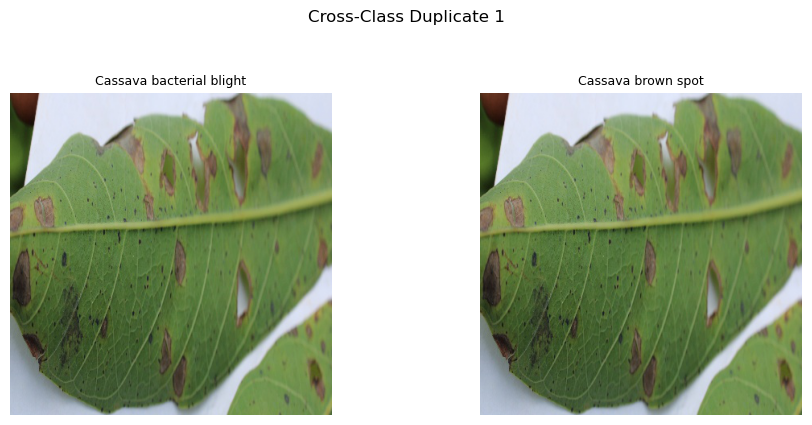

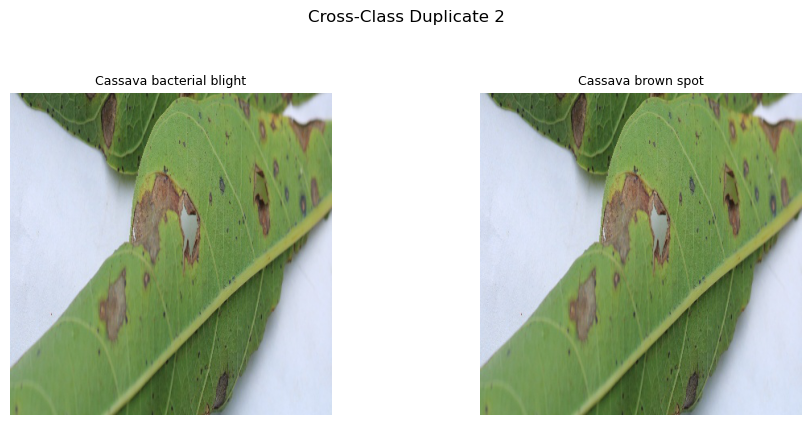

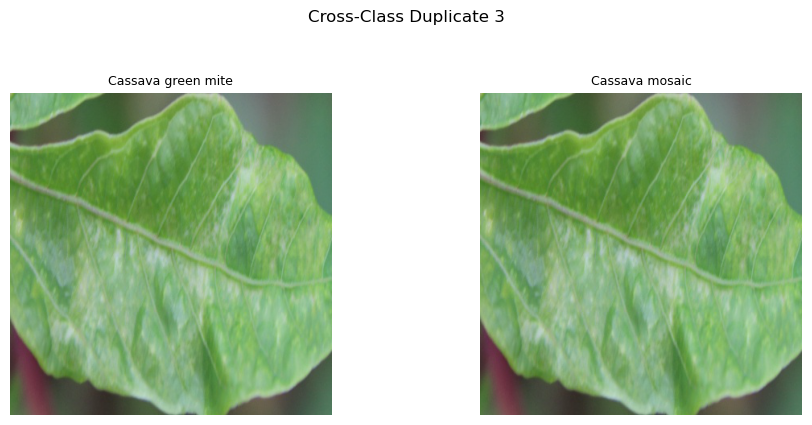

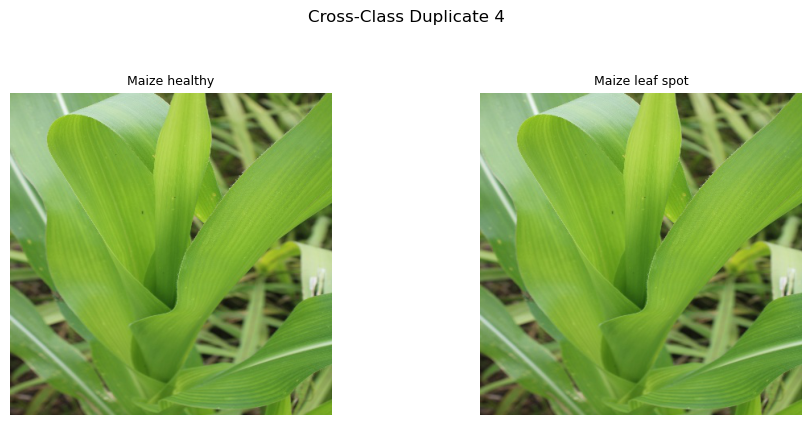

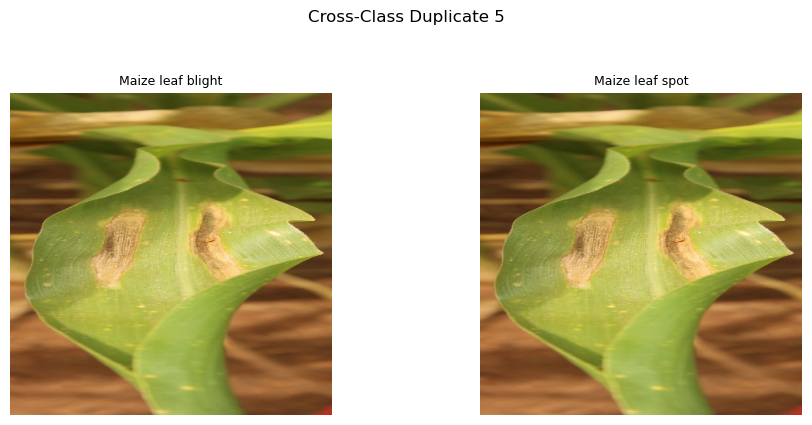

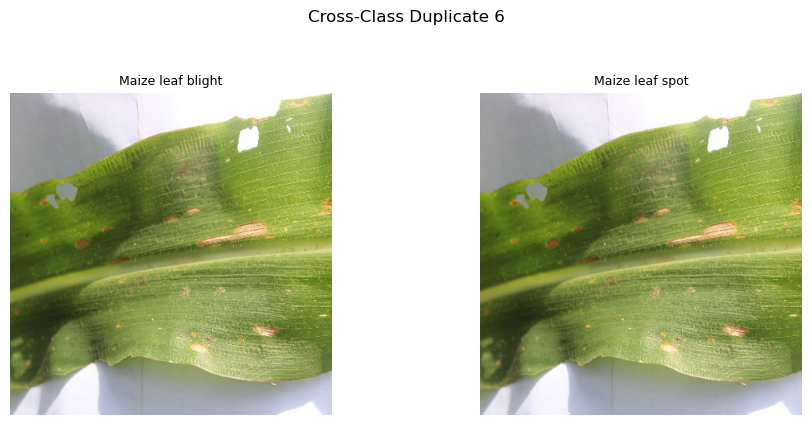

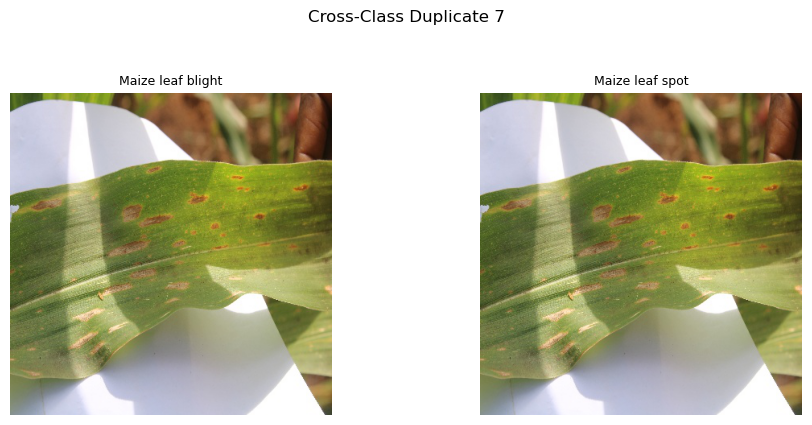

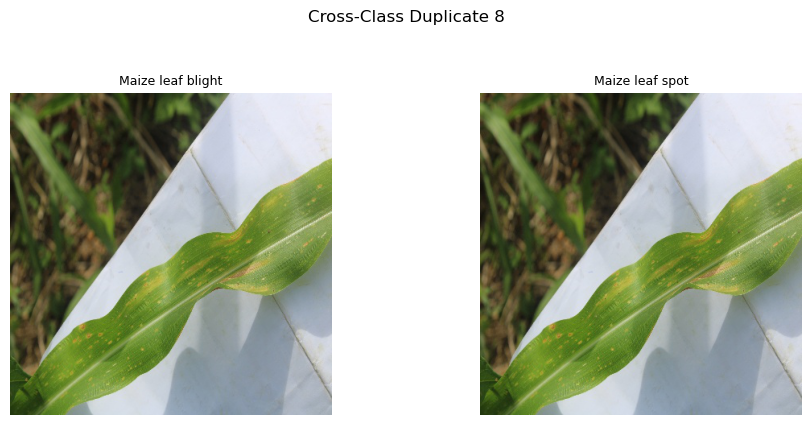

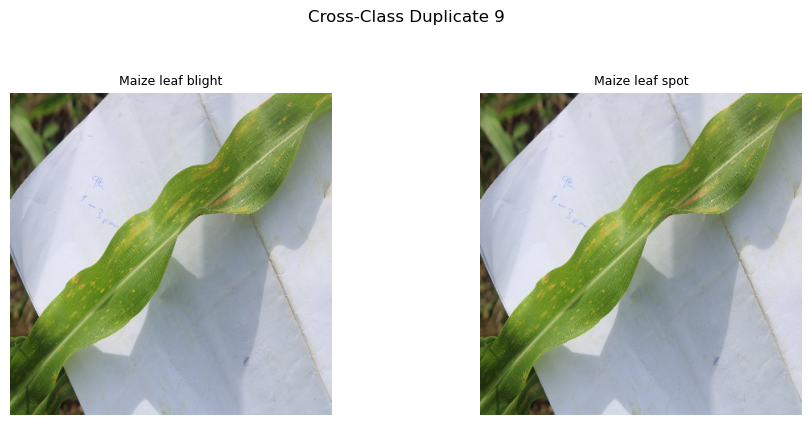

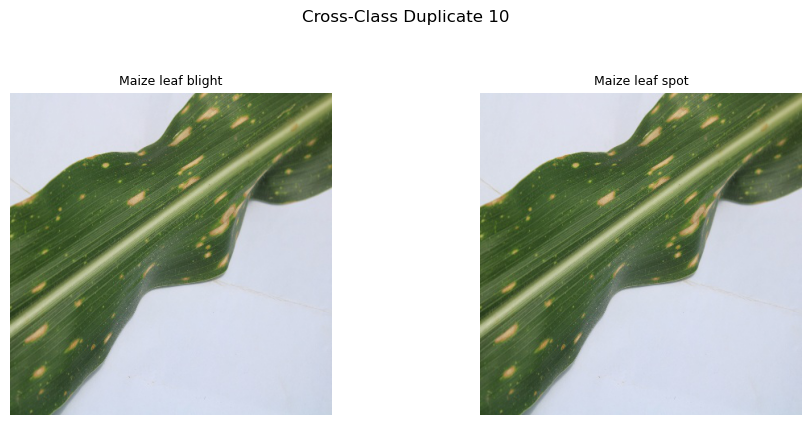

In [15]:
# Ambil list hash yang terdeteksi duplikat antar kelas
duplicate_hashes = list(cross_class_duplicates.keys())

print(f"Total cross-class duplicate hashes: {len(duplicate_hashes)}")

# Loop untuk menampilkan contoh gambar duplikat antar kelas
for j, dup_hash in enumerate(duplicate_hashes, start=1):
    cls_paths = cross_class_duplicates[dup_hash]
    
    plt.figure(figsize=(10, 4))
    for k, (cls, img_path) in enumerate(cls_paths):
        try:
            img = Image.open(img_path)
            plt.subplot(1, len(cls_paths), k + 1)
            plt.imshow(img)
            plt.title(cls, fontsize=9)
            plt.axis("off")
        except Exception:
            continue

    plt.suptitle(f"Cross-Class Duplicate {j}", fontsize=12, y=1.05)
    plt.tight_layout()
    plt.show()
    
    # Tampilkan maksimal 5 contoh pertama biar nggak kebanyakan
    if j >= 10:
        break


#### 3. Check Broken Image

In [16]:
broken_images = []
for class_name in tqdm(os.listdir(data_path), desc="Checking images"):
    class_dir = os.path.join(data_path, class_name)
    if not os.path.isdir(class_dir):
        continue

    for file in os.listdir(class_dir):
        file_path = os.path.join(class_dir, file)
        
        try:
            with Image.open(file_path) as img:
                _ = img.tobytes()

                if img.size[0] == 0 or img.size[1] == 0:
                    raise ValueError("Image has zero dimension")
            
        except (UnidentifiedImageError, OSError, ValueError) as e:
            broken_images.append(file_path)
            continue

Checking images: 100%|██████████| 22/22 [00:59<00:00,  2.71s/it]


In [16]:
print("Total gambar rusak:", len(broken_images))
for img_path in broken_images:
    print(img_path)

Total gambar rusak: 94
crop_pest_and_disease\Maize healthy\healthy189_.jpg
crop_pest_and_disease\Maize healthy\healthy18_.jpg
crop_pest_and_disease\Maize healthy\healthy87_.jpg
crop_pest_and_disease\Maize healthy\healthy88_.jpg
crop_pest_and_disease\Maize leaf beetle\leaf beetle206_.jpg
crop_pest_and_disease\Maize leaf beetle\leaf beetle207_.jpg
crop_pest_and_disease\Maize leaf beetle\leaf beetle208_.jpg
crop_pest_and_disease\Maize leaf beetle\leaf beetle326_.jpg
crop_pest_and_disease\Maize leaf beetle\leaf beetle457_.jpg
crop_pest_and_disease\Maize leaf beetle\leaf beetle458_.jpg
crop_pest_and_disease\Maize leaf beetle\leaf beetle572_.jpg
crop_pest_and_disease\Maize leaf beetle\leaf beetle573_.jpg
crop_pest_and_disease\Maize leaf beetle\leaf beetle68_.jpg
crop_pest_and_disease\Maize leaf beetle\leaf beetle690_.jpg
crop_pest_and_disease\Maize leaf beetle\leaf beetle691_.jpg
crop_pest_and_disease\Maize leaf beetle\leaf beetle797_.jpg
crop_pest_and_disease\Maize leaf beetle\leaf beetle79

#### 4 Check Distribution Size/ Dimension Per Class

In [17]:
dims = []

for class_name in os.listdir(data_path):
    class_dir = os.path.join(data_path, class_name)
    if os.path.isdir(class_dir):
        for file in os.listdir(class_dir):
            file_path = os.path.join(class_dir, file)
            try:
                with Image.open(file_path) as img:
                    w, h = img.size
                    dims.append({"class": class_name, "width": w, "height": h})
            except:
                continue

Jumlah total data dimensi: 25170
                class  width  height
0  Cashew anthracnose    400     400
1  Cashew anthracnose    400     400
2  Cashew anthracnose    400     400
3  Cashew anthracnose    400     400
4  Cashew anthracnose    400     400


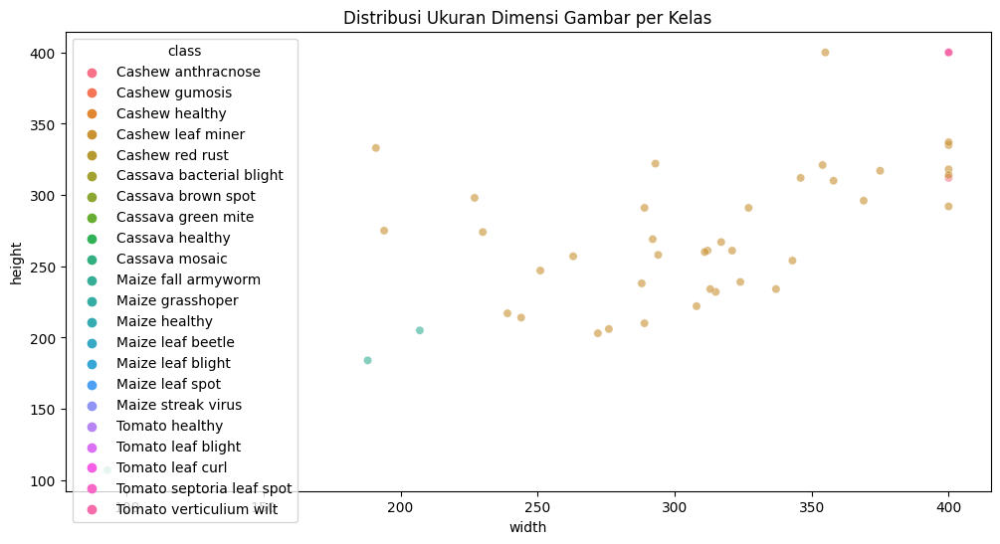

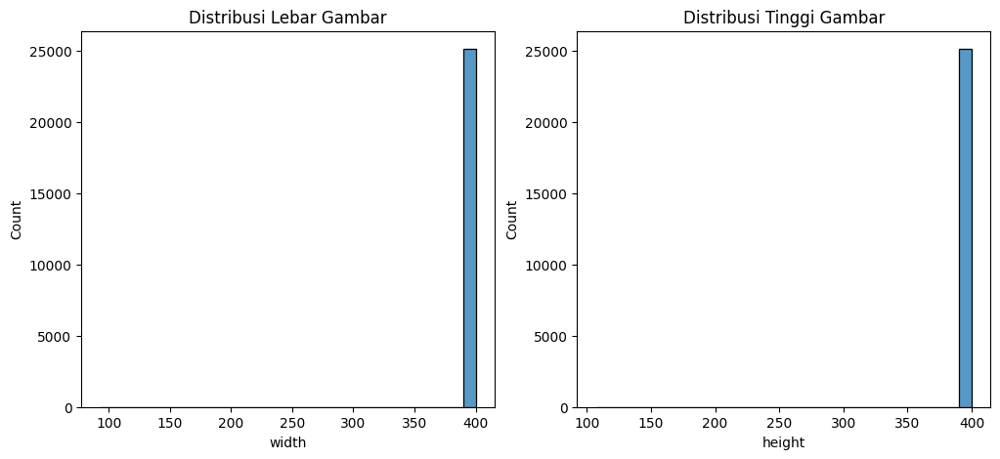

In [18]:
dims_df = pd.DataFrame(dims)

print("Jumlah total data dimensi:", len(dims_df))
print(dims_df.head())

# Plot distribusi
plt.figure(figsize=(12,6))
sns.scatterplot(data=dims_df, x="width", y="height", hue="class", alpha=0.6)
plt.title("Distribusi Ukuran Dimensi Gambar per Kelas")
plt.show()

# Distribusi histogram lebar & tinggi
plt.figure(figsize=(12,5))
plt.subplot(1,2,1)
sns.histplot(dims_df["width"], bins=30, kde=False)
plt.title("Distribusi Lebar Gambar")

plt.subplot(1,2,2)
sns.histplot(dims_df["height"], bins=30, kde=False)
plt.title("Distribusi Tinggi Gambar")
plt.show()

#### 5. Check RGB

In [19]:
color_modes = []
for class_name in os.listdir(data_path):
    class_dir = os.path.join(data_path, class_name)
    if os.path.isdir(class_dir):
        for file in os.listdir(class_dir):
            file_path = os.path.join(class_dir, file)
            try:
                with Image.open(file_path) as img:
                    color_modes.append(img.mode)
            except:
                continue

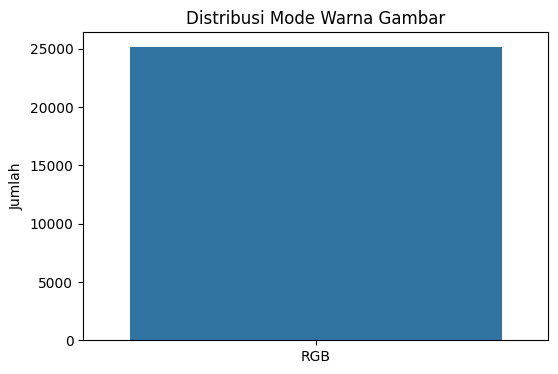

Counter({'RGB': 25170})

In [20]:
mode_counts = Counter(color_modes)

plt.figure(figsize=(6,4))
sns.barplot(x=list(mode_counts.keys()), y=list(mode_counts.values()))
plt.title("Distribusi Mode Warna Gambar")
plt.ylabel("Jumlah")
plt.show()

mode_counts

#### 6. Check Brightness

In [21]:
brightness_scores = {}

for class_name in os.listdir(data_path):
    class_dir = os.path.join(data_path, class_name)
    if os.path.isdir(class_dir):
        scores = []
        for file in os.listdir(class_dir):
            file_path = os.path.join(class_dir, file)
            try:
                img = cv2.imread(file_path, cv2.IMREAD_GRAYSCALE)
                if img is not None:
                    brightness = img.mean()
                    scores.append(brightness)
            except:
                continue
        brightness_scores[class_name] = scores

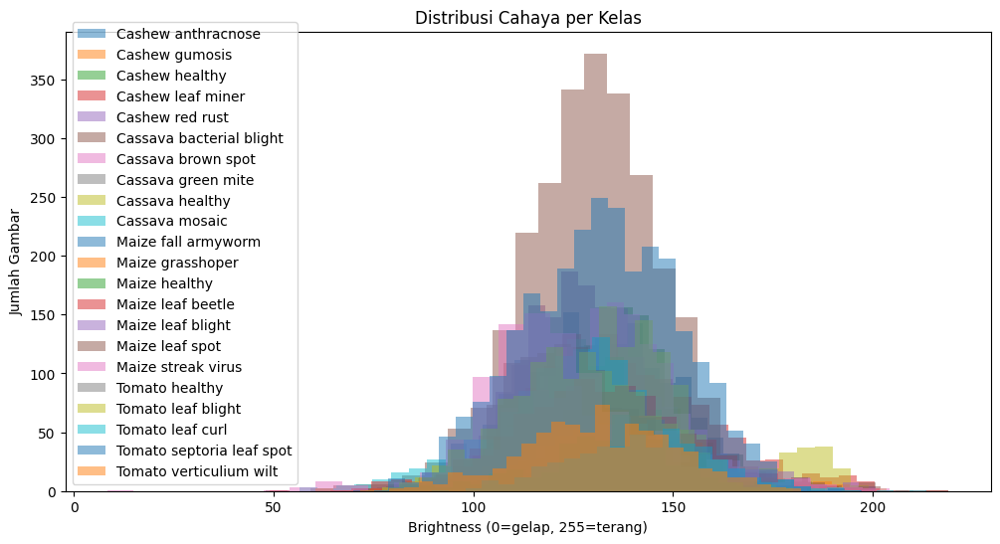

In [22]:
# Plot distribusi cahaya
plt.figure(figsize=(12,6))
for cls, scores in brightness_scores.items():
    plt.hist(scores, bins=30, alpha=0.5, label=cls)

plt.title("Distribusi Cahaya per Kelas")
plt.xlabel("Brightness (0=gelap, 255=terang)")
plt.ylabel("Jumlah Gambar")
plt.legend()
plt.show()

In [23]:
brightness = defaultdict(list)

for cls in sorted(os.listdir(data_path)):
    cls_path = os.path.join(data_path, cls)
    if os.path.isdir(cls_path):
        for file in os.listdir(cls_path):
            if file.lower().endswith(valid_exts):
                path = os.path.join(cls_path, file)
                try:
                    img = cv2.imread(path, cv2.IMREAD_GRAYSCALE)
                    if img is not None:
                        brightness[cls].append(np.mean(img))
                except:
                    pass

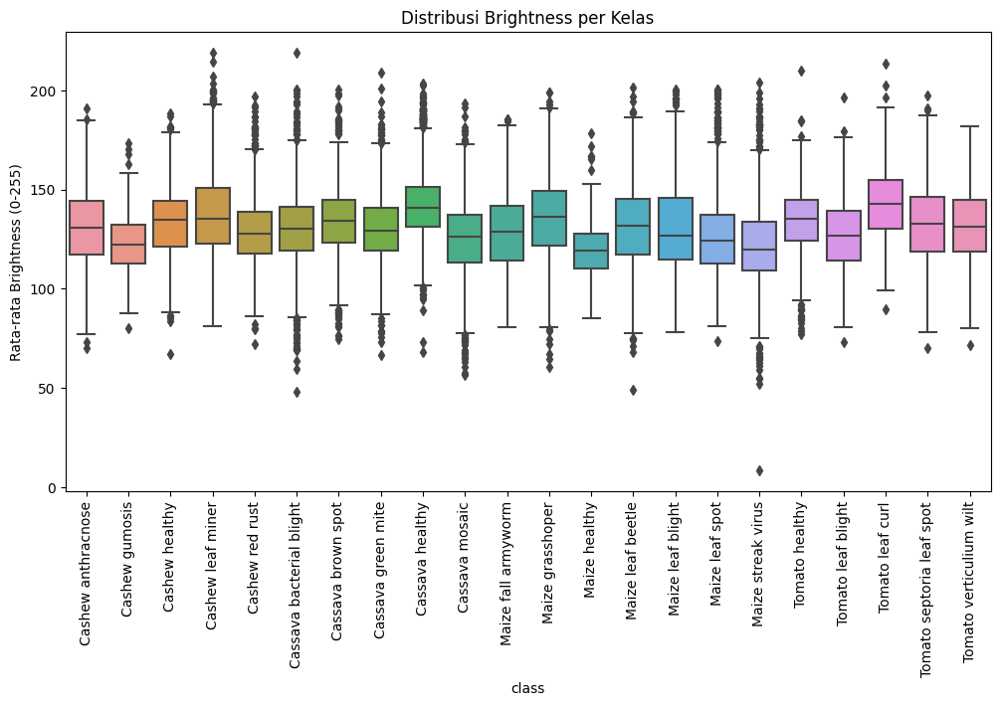

In [24]:
brightness_df = pd.DataFrame([
    {"class": cls, "brightness": b}
    for cls, values in brightness.items()
    for b in values
])

plt.figure(figsize=(12,6))
sns.boxplot(data=brightness_df, x="class", y="brightness")
plt.xticks(rotation=90)
plt.ylabel("Rata-rata Brightness (0-255)")
plt.title("Distribusi Brightness per Kelas")
plt.show()

#### 7. Check Blur

In [25]:
blur_scores = defaultdict(list)
laplacian_threshold = 100  # threshold blur

for cls in sorted(os.listdir(data_path)):
    cls_path = os.path.join(data_path, cls)
    if os.path.isdir(cls_path):
        for file in os.listdir(cls_path):
            if file.lower().endswith(valid_exts):
                path = os.path.join(cls_path, file)
                try:
                    img = cv2.imread(path, cv2.IMREAD_GRAYSCALE)
                    if img is not None:
                        score = cv2.Laplacian(img, cv2.CV_64F).var()
                        blur_scores[cls].append(score)
                except:
                    pass

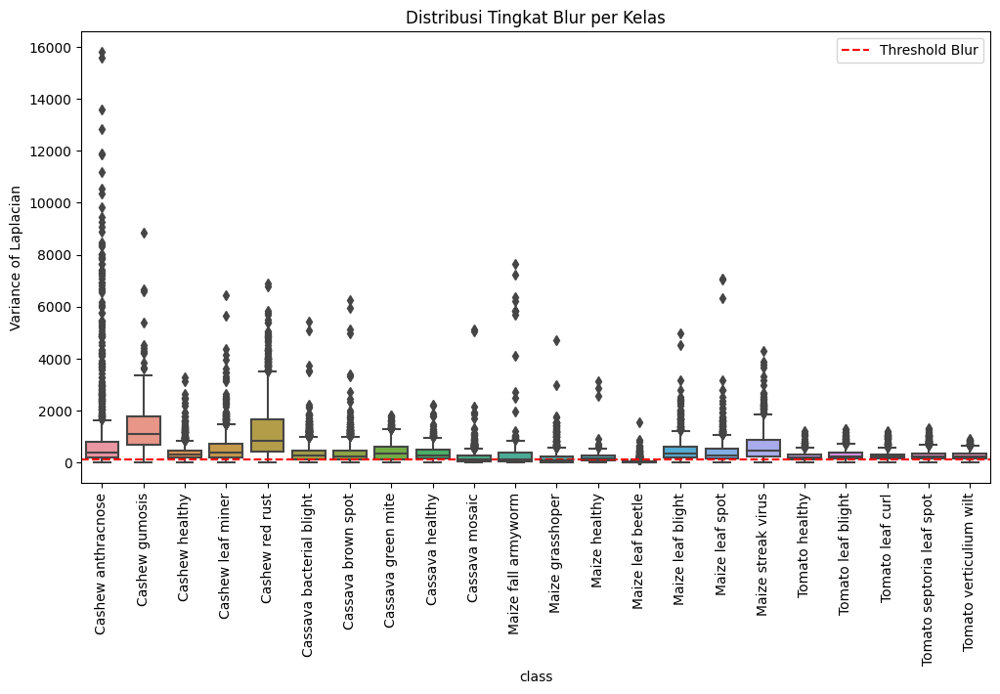

Total gambar dianggap blur (< 100): 4940
Total gambar: 25170


In [26]:
blur_df = pd.DataFrame([
    {"class": cls, "blur": b}
    for cls, values in blur_scores.items()
    for b in values
])

plt.figure(figsize=(12,6))
sns.boxplot(data=blur_df, x="class", y="blur")
plt.axhline(laplacian_threshold, color="red", linestyle="--", label="Threshold Blur")
plt.legend()
plt.xticks(rotation=90)
plt.ylabel("Variance of Laplacian")
plt.title("Distribusi Tingkat Blur per Kelas")
plt.show()

total_blur = (blur_df["blur"] < laplacian_threshold).sum()
print(f"Total gambar dianggap blur (< {laplacian_threshold}): {total_blur}")
print(f"Total gambar: {len(blur_df)}")

## Preprocessing

In [27]:
output_path = "dataset_preprocessed"
os.makedirs(output_path, exist_ok=True)

#### 1. Remove Broken Images

In [28]:
for class_name in tqdm(os.listdir(data_path), desc="Processing classes"):
    folder_kelas_asli = os.path.join(data_path, class_name)
    if os.path.isdir(folder_kelas_asli):
        folder_kelas_tujuan = os.path.join(output_path, class_name)
        os.makedirs(folder_kelas_tujuan, exist_ok=True)

        for file in os.listdir(folder_kelas_asli):
            path_asal = os.path.join(folder_kelas_asli, file)
            path_tujuan = os.path.join(folder_kelas_tujuan, file)

            # Jika tidak ada di broken_images, skip
            if path_asal in broken_images:
                continue

            try:
                with Image.open(path_asal) as img:
                    img.verify()

                shutil.copy2(path_asal, path_tujuan)
                
            except (UnidentifiedImageError, OSError):
                print(f"File broken diskip: {path_asal}")
                continue

print("Success!")
print(f"Folder hasil: {output_path}")

Processing classes: 100%|██████████| 22/22 [01:54<00:00,  5.22s/it]

Success!
Folder hasil: dataset_preprocessed


In [29]:
total_preprocessed, image_per_class_preprocessed = count_total_images(output_path)
print(f"Total gambar asli                        : {total_images}")
print(f"Total gambar setelah hapus broken images : {total_preprocessed}")

Total gambar asli                        : 25220
Total gambar setelah hapus broken images : 25126


In [30]:
print("Total Images Summary:")
print(f"{'Kelas':<35} | {'Asli':>8} | {'Preprocessed':>13}")
print("-" * 62)

for kelas in sorted(image_per_class.keys()):
    asli = image_per_class.get(kelas, 0)
    pre = image_per_class_preprocessed.get(kelas, 0)
    print(f"{kelas:<35} | {asli:>8} | {pre:>13}")

Total Images Summary:
Kelas                               |     Asli |  Preprocessed
--------------------------------------------------------------
Cashew anthracnose                  |     1729 |          1729
Cashew gumosis                      |      392 |           392
Cashew healthy                      |     1368 |          1368
Cashew leaf miner                   |     1378 |          1378
Cashew red rust                     |     1682 |          1682
Cassava bacterial blight            |     2614 |          2614
Cassava brown spot                  |     1481 |          1481
Cassava green mite                  |     1015 |          1015
Cassava healthy                     |     1193 |          1193
Cassava mosaic                      |     1205 |          1205
Maize fall armyworm                 |      285 |           285
Maize grasshoper                    |      673 |           673
Maize healthy                       |      208 |           204
Maize leaf beetle                

#### 2. Handling Duplicate Images

##### 2.1 Same Class

In [31]:
deleted_count = 0
deleted_per_class = defaultdict(int)

In [32]:
for class_name, duplicate_files in duplicates.items():
    class_folder = os.path.join(output_path, class_name)

    # Skip jika class foldernya tidak ada
    if not os.path.exists(class_folder):
        continue

    for duplicate_path in duplicate_files:
        file_name = os.path.basename(duplicate_path)
        target_file = os.path.join(class_folder, file_name)

        # Cek apakah ada yang terduplikat
        if os.path.exists(target_file):
            os.remove(target_file)
            deleted_per_class[class_name] += 1
            deleted_count += 1

In [33]:
print(f"{'Kelas':<35} | {'Duplicates Removed':>18}")
print("-" * 56)

for class_name, count in sorted(deleted_per_class.items()):
    print(f"{class_name:<35} | {count:>18}")

print("-" * 56)
print(f"{'Total duplicates removed':<35} | {deleted_count:>18}")

Kelas                               | Duplicates Removed
--------------------------------------------------------
Cashew red rust                     |                  1
Cassava bacterial blight            |                 20
Cassava brown spot                  |                 14
Cassava mosaic                      |                 92
Maize fall armyworm                 |                  1
Maize leaf blight                   |                  3
Maize leaf spot                     |                 23
Tomato healthy                      |                  3
Tomato leaf blight                  |                  2
Tomato septoria leaf spot           |                448
--------------------------------------------------------
Total duplicates removed            |                607


In [34]:
total_after_removed_duplicates, image_per_class_removed_duplicates= count_total_images(output_path)
print(f"Total gambar setelah hapus duplicates : {total_after_removed_duplicates}")

Total gambar setelah hapus duplicates : 24519


In [35]:
print("Total Images Summary After Removing Duplicates:")
print(f"{'Kelas':<35} | {'Before':>8} | {'After':>13}")
print("-" * 62)

for kelas in sorted(image_per_class.keys()):
    before = image_per_class_preprocessed.get(kelas, 0)
    after = image_per_class_removed_duplicates.get(kelas, 0)
    print(f"{kelas:<35} | {before:>8} | {after:>13}")

Total Images Summary After Removing Duplicates:
Kelas                               |   Before |         After
--------------------------------------------------------------
Cashew anthracnose                  |     1729 |          1729
Cashew gumosis                      |      392 |           392
Cashew healthy                      |     1368 |          1368
Cashew leaf miner                   |     1378 |          1378
Cashew red rust                     |     1682 |          1681
Cassava bacterial blight            |     2614 |          2594
Cassava brown spot                  |     1481 |          1467
Cassava green mite                  |     1015 |          1015
Cassava healthy                     |     1193 |          1193
Cassava mosaic                      |     1205 |          1113
Maize fall armyworm                 |      285 |           284
Maize grasshoper                    |      673 |           673
Maize healthy                       |      204 |           204
Maize l

##### 2.2 Cross Class

In [36]:
deleted_total_cross = 0
deleted_per_class_cross = defaultdict(int)

for h, cls_paths in cross_class_duplicates.items():
    for cls, original_path in cls_paths:
        file_name = os.path.basename(original_path)
        target_file = os.path.join(output_path, cls, file_name)

        # Cek file apakah ada di preprocessed folder, hapus jika ada
        if os.path.exists(target_file):
            os.remove(target_file)
            deleted_per_class_cross[cls] += 1
            deleted_total_cross += 1

In [37]:
print(f"{'Kelas':<36} | {'Cross-class Removed':>20}")
print("-" * 59)
for cls, count in sorted(deleted_per_class_cross.items()):
    print(f"{cls:<36} | {count:>20}")
print("-" * 59)
print(f"{'Total cross-class duplicates removed':<35} | {deleted_total_cross:>20}")

Kelas                                |  Cross-class Removed
-----------------------------------------------------------
Cassava bacterial blight             |                    2
Cassava brown spot                   |                    2
Cassava green mite                   |                    1
Cassava mosaic                       |                    1
Maize healthy                        |                    1
Maize leaf blight                    |                  202
Maize leaf spot                      |                  189
Maize streak virus                   |                   48
Tomato leaf blight                   |                    1
Tomato septoria leaf spot            |                    1
-----------------------------------------------------------
Total cross-class duplicates removed |                  448


In [38]:
total_after_removed_duplicates_cross, image_per_class_removed_duplicates_cross = count_total_images(output_path)
print(f"Total gambar setelah hapus cross-class duplicates : {total_after_removed_duplicates_cross}")

Total gambar setelah hapus cross-class duplicates : 24071


In [39]:
print("Total Images Summary After Removing Cross-Class Duplicates:")
print(f"{'Kelas':<35} | {'Before':>8} | {'After':>13}")
print("-" * 62)

for kelas in sorted(image_per_class.keys()):
    before = image_per_class_removed_duplicates.get(kelas, 0)
    after = image_per_class_removed_duplicates_cross.get(kelas, 0)
    print(f"{kelas:<35} | {before:>8} | {after:>13}")

Total Images Summary After Removing Cross-Class Duplicates:
Kelas                               |   Before |         After
--------------------------------------------------------------
Cashew anthracnose                  |     1729 |          1729
Cashew gumosis                      |      392 |           392
Cashew healthy                      |     1368 |          1368
Cashew leaf miner                   |     1378 |          1378
Cashew red rust                     |     1681 |          1681
Cassava bacterial blight            |     2594 |          2592
Cassava brown spot                  |     1467 |          1465
Cassava green mite                  |     1015 |          1014
Cassava healthy                     |     1193 |          1193
Cassava mosaic                      |     1113 |          1112
Maize fall armyworm                 |      284 |           284
Maize grasshoper                    |      673 |           673
Maize healthy                       |      204 |          

#### 3. Adjust Brightness

In [40]:
def get_brightness_score(input_dir):
    brightness_scores = {}

    for class_name in os.listdir(input_dir):
        class_dir = os.path.join(input_dir, class_name)

        scores = []
        for file in os.listdir(class_dir):
            file_path = os.path.join(class_dir, file)
            img = cv2.imread(file_path, cv2.IMREAD_GRAYSCALE)

            brightness = img.mean()
            scores.append(brightness)
        
        brightness_scores[class_name] = scores
    
    return brightness_scores

In [41]:
def compute_brightness_factors(brightness_scores, target_brightness=140):
    class_avg = {
        cls: np.mean(scores) if len(scores) > 0 else target_brightness
        for cls, scores in brightness_scores.items()
    }

    class_factors = {
        cls: np.clip(target_brightness / (avg + 1e-8), 0.6, 1.6)
        for cls, avg in class_avg.items()
    }

    print("Rata-rata brightness per kelas:")
    for cls, val in class_avg.items():
        print(f"{cls:<30}: {val:.2f}")

    return class_factors

In [42]:
def adjust_brightness_dataset(dataset_dir, target_brightness=140):
    brightness_scores = get_brightness_score(dataset_dir)
    brightness_factors = compute_brightness_factors(brightness_scores, target_brightness)

    for class_name in tqdm(os.listdir(dataset_dir), desc="Adjusting brightness"):
        class_path = os.path.join(dataset_dir, class_name)
    
        factor = brightness_factors.get(class_name, 1.0)

        for file in os.listdir(class_path):
            path_asal = os.path.join(class_path, file)
            temp_path = os.path.join(class_path, f"temp_{file}")

            try:
                img = Image.open(path_asal).convert('RGB')
                enhancer = ImageEnhance.Brightness(img)
                adjusted_img = enhancer.enhance(factor)

                adjusted_img.save(temp_path)

                os.remove(path_asal)
                os.rename(temp_path, path_asal)

            except Exception as e:
                print(f"Gagal proses {path_asal}: {e}")
                if os.path.exists(temp_path):
                    os.remove(temp_path)
                continue

    print("Success")
    print(f"Hasil tersimpan di folder: {dataset_dir}")

In [43]:
dataset_dir = "dataset_preprocessed"
adjust_brightness_dataset(dataset_dir, target_brightness=140)

Rata-rata brightness per kelas:
Cashew anthracnose            : 130.97
Cashew gumosis                : 123.05
Cashew healthy                : 133.21
Cashew leaf miner             : 138.10
Cashew red rust               : 129.11
Cassava bacterial blight      : 130.21
Cassava brown spot            : 133.78
Cassava green mite            : 130.35
Cassava healthy               : 143.57
Cassava mosaic                : 124.87
Maize fall armyworm           : 129.85
Maize grasshoper              : 136.22
Maize healthy                 : 120.55
Maize leaf beetle             : 131.59
Maize leaf blight             : 133.68
Maize leaf spot               : 127.03
Maize streak virus            : 123.37
Tomato healthy                : 133.99
Tomato leaf blight            : 126.80
Tomato leaf curl              : 143.08
Tomato septoria leaf spot     : 132.75
Tomato verticulium wilt       : 131.56


Adjusting brightness: 100%|██████████| 22/22 [02:02<00:00,  5.55s/it]

Success
Hasil tersimpan di folder: dataset_preprocessed


#### 4. Image Sharpening (Unsharp Masking)

In [44]:
def get_blur_score(image_path):
    img = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)

    return cv2.Laplacian(img, cv2.CV_64F).var()

In [45]:
def sharpen_image(img, strength, blur_ksize=(3,3)):
    img_np = np.array(img)
    
    img_bgr = cv2.cvtColor(img_np, cv2.COLOR_RGB2BGR)
    blurred = cv2.GaussianBlur(img_bgr, blur_ksize, 0)
    
    sharpened = cv2.addWeighted(img_bgr, 1 + strength, blurred, -strength, 0)
    sharpened_rgb = cv2.cvtColor(sharpened, cv2.COLOR_BGR2RGB)
    
    return Image.fromarray(sharpened_rgb)

In [46]:
def sharpen_dataset(dataset_dir, laplacian_threshold=100):
    for class_name in tqdm(os.listdir(dataset_dir), desc="Adaptive sharpening"):
        class_path = os.path.join(dataset_dir, class_name)

        for file in os.listdir(class_path):
            file_path = os.path.join(class_path, file)

            try:
                score = get_blur_score(file_path)
                
                if score < laplacian_threshold:
                    # Semakin blur, semakin kuat tingkat sharpening
                    strength = 1.0 if score < 50 else 0.7

                    with Image.open(file_path).convert('RGB') as img:
                        sharpened_img = sharpen_image(img, strength=strength)

                        temp_path = os.path.join(class_path, f"temp_{file}")
                        sharpened_img.save(temp_path)

                        os.remove(file_path)
                        os.rename(temp_path, file_path)

            except Exception as e:
                print(f"Gagal proses {file_path}: {e}")
                continue

    print("Success")
    print(f"Hasil tersimpan di folder: {dataset_dir}")

In [47]:
sharpen_dataset("dataset_preprocessed")

Adaptive sharpening: 100%|██████████| 22/22 [05:07<00:00, 13.96s/it]

Success
Hasil tersimpan di folder: dataset_preprocessed


#### Split Dataset

In [2]:
source_dir = "dataset_preprocessed"
output_dir = "dataset_split"

splits = ["train", "val", "test"]
ratios = [0.7, 0.15, 0.15]

for split in splits:
    os.makedirs(os.path.join(output_dir, split), exist_ok=True)

In [3]:
classes = os.listdir(source_dir)

for cls in classes:
    class_dir = os.path.join(source_dir, cls)
    images = os.listdir(class_dir)
    random.shuffle(images)

    total = len(images)
    train_end = int(total * ratios[0])
    val_end = train_end + int(total * ratios[1])

    train_imgs = images[:train_end]
    val_imgs = images[train_end:val_end]
    test_imgs = images[val_end:]

    # Create class folders
    for split in splits:
        os.makedirs(os.path.join(output_dir, split, cls), exist_ok=True)

    # Copy images
    for img in train_imgs:
        shutil.copy(
            os.path.join(class_dir, img),
            os.path.join(output_dir, "train", cls, img)
        )

    for img in val_imgs:
        shutil.copy(
            os.path.join(class_dir, img),
            os.path.join(output_dir, "val", cls, img)
        )

    for img in test_imgs:
        shutil.copy(
            os.path.join(class_dir, img),
            os.path.join(output_dir, "test", cls, img)
        )

print("Success")

Success


In [10]:
total_count = 0

for split in splits:
    split_path = os.path.join(output_dir, split)
    split_total = 0

    print(f"--- {split.upper()} ---")
    
    for cls in os.listdir(split_path):
        class_path = os.path.join(split_path, cls)
        count = len(os.listdir(class_path))
        split_total += count
        print(f"{cls:<30} : {count}")

    print(f"Total {split:<25}: {split_total}\n")
    total_count += split_total

print("======================================")
print(f"Total Images: {total_count}")

--- TRAIN ---
Cashew anthracnose             : 1210
Cashew gumosis                 : 274
Cashew healthy                 : 957
Cashew leaf miner              : 964
Cashew red rust                : 1176
Cassava bacterial blight       : 1814
Cassava brown spot             : 1025
Cassava green mite             : 709
Cassava healthy                : 835
Cassava mosaic                 : 778
Maize fall armyworm            : 198
Maize grasshoper               : 471
Maize healthy                  : 142
Maize leaf beetle              : 653
Maize leaf blight              : 549
Maize leaf spot                : 718
Maize streak virus             : 641
Tomato healthy                 : 324
Tomato leaf blight             : 899
Tomato leaf curl               : 357
Tomato septoria leaf spot      : 1605
Tomato verticulium wilt        : 540
Total train                    : 16839

--- VAL ---
Cashew anthracnose             : 259
Cashew gumosis                 : 58
Cashew healthy                 : 205
Cashe

## Model: DenseNet121

In [7]:
IMG_SIZE = (224, 224)
BATCH_SIZE = 32

train_ds = tf.keras.preprocessing.image_dataset_from_directory(
    "dataset_split/train",
    image_size=IMG_SIZE,
    batch_size=BATCH_SIZE,
    label_mode = "categorical"
)

val_ds = tf.keras.preprocessing.image_dataset_from_directory(
    "dataset_split/val",
    image_size=IMG_SIZE,
    batch_size=BATCH_SIZE,
    label_mode = "categorical"
)

test_ds = tf.keras.preprocessing.image_dataset_from_directory(
    "dataset_split/test",
    image_size=IMG_SIZE,
    batch_size=BATCH_SIZE,
    label_mode = "categorical"
)

Found 16839 files belonging to 22 classes.
Found 3598 files belonging to 22 classes.
Found 3634 files belonging to 22 classes.


In [8]:
class_names = train_ds.class_names
num_classes = len(class_names)
print(class_names)
print(num_classes)

['Cashew anthracnose', 'Cashew gumosis', 'Cashew healthy', 'Cashew leaf miner', 'Cashew red rust', 'Cassava bacterial blight', 'Cassava brown spot', 'Cassava green mite', 'Cassava healthy', 'Cassava mosaic', 'Maize fall armyworm', 'Maize grasshoper', 'Maize healthy', 'Maize leaf beetle', 'Maize leaf blight', 'Maize leaf spot', 'Maize streak virus', 'Tomato healthy', 'Tomato leaf blight', 'Tomato leaf curl', 'Tomato septoria leaf spot', 'Tomato verticulium wilt']
22


In [ ]:
pretrained_model = tf.keras.applications.DenseNet121(
    include_top=False,
    weights="imagenet",
    input_shape=(224,224,3),
    classes=num_classes
)

pretrained_model.trainable = True

# Freeze ~300 layer awal
for layer in pretrained_model.layers[:-100]:
    layer.trainable = False  

In [10]:
x = pretrained_model.output
x = layers.GlobalAveragePooling2D()(x)
x = layers.BatchNormalization()(x)
x = layers.Dense(256, activation='relu')(x)
x = layers.Dropout(0.5)(x)

output = layers.Dense(
    num_classes,  # ganti sesuai jumlah kelas kamu
    activation='softmax'
)(x)

In [11]:
model = models.Model(inputs=pretrained_model.input, outputs=output)

In [12]:
model.compile(
    optimizer=tf.keras.optimizers.Adam(learning_rate=1e-4),
    loss='categorical_crossentropy',  # kalau one-hot
    metrics=['accuracy']
)

In [13]:
model.summary()

Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer         │ (None, 224, 224,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ zero_padding2d      │ (None, 230, 230,  │          0 │ input_layer[0][0] │
│ (ZeroPadding2D)     │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_conv (Conv2D) │ (None, 112, 112,  │      9,408 │ zero_padding2d[0… │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_bn            │ (None, 112, 112,  │        256 │ conv1_conv[0][0]  │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_relu          │ (None, 112, 112,  │          0 │ conv1_bn[0][0]    │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ zero_padding2d_1    │ (None, 114, 114,  │          0 │ conv1_relu[0][0]  │
│ (ZeroPadding2D)     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ pool1               │ (None, 56, 56,    │          0 │ zero_padding2d_1… │
│ (MaxPooling2D)      │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_0_bn   │ (None, 56, 56,    │        256 │ pool1[0][0]       │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_0_relu │ (None, 56, 56,    │          0 │ conv2_block1_0_b… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_conv │ (None, 56, 56,    │      8,192 │ conv2_block1_0_r… │
│ (Conv2D)            │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_bn   │ (None, 56, 56,    │        512 │ conv2_block1_1_c… │
│ (BatchNormalizatio… │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_relu │ (None, 56, 56,    │          0 │ conv2_block1_1_b… │
│ (Activation)        │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_2_conv │ (None, 56, 56,    │     36,864 │ conv2_block1_1_r… │
│ (Conv2D)            │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_concat │ (None, 56, 56,    │          0 │ pool1[0][0],      │
│ (Concatenate)       │ 96)               │            │ conv2_block1_2_c… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block2_0_bn   │ (None, 56, 56,    │        384 │ conv2_block1_con… │
│ (BatchNormalizatio… │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block2_0_relu │ (None, 56, 56,    │          0 │ conv2_block2_0_b… │
│ (Activation)        │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block2_1_conv │ (None, 56, 56,    │     12,288 │ conv2_block2_0_r

 Total params: 7,309,654 (27.88 MB)

 Trainable params: 2,218,710 (8.46 MB)

 Non-trainable params: 5,090,944 (19.42 MB)

In [14]:
callbacks = [
    tf.keras.callbacks.EarlyStopping(
        monitor='val_loss',
        patience=5,
        restore_best_weights=True
    ),
    tf.keras.callbacks.ReduceLROnPlateau(
        monitor='val_loss',
        factor=0.2,
        patience=3,
        min_lr=1e-6
    )
]

In [15]:
history = model.fit(
    train_ds,
    validation_data=val_ds,
    epochs=20,
    callbacks=callbacks
)

Epoch 1/20
527/527 ━━━━━━━━━━━━━━━━━━━━ 671s 1s/step - accuracy: 0.4653 - loss: 1.7893 - val_accuracy: 0.6779 - val_loss: 1.0515 - learning_rate: 1.0000e-04
Epoch 2/20
527/527 ━━━━━━━━━━━━━━━━━━━━ 706s 1s/step - accuracy: 0.6618 - loss: 1.0471 - val_accuracy: 0.7412 - val_loss: 0.7545 - learning_rate: 1.0000e-04
Epoch 3/20
527/527 ━━━━━━━━━━━━━━━━━━━━ 701s 1s/step - accuracy: 0.7366 - loss: 0.7967 - val_accuracy: 0.7702 - val_loss: 0.6821 - learning_rate: 1.0000e-04
Epoch 4/20
527/527 ━━━━━━━━━━━━━━━━━━━━ 675s 1s/step - accuracy: 0.7918 - loss: 0.6278 - val_accuracy: 0.7849 - val_loss: 0.6307 - learning_rate: 1.0000e-04
Epoch 5/20
527/527 ━━━━━━━━━━━━━━━━━━━━ 588s 1s/step - accuracy: 0.8224 - loss: 0.5182 - val_accuracy: 0.8029 - val_loss: 0.5767 - learning_rate: 1.0000e-04
Epoch 6/20
527/527 ━━━━━━━━━━━━━━━━━━━━ 583s 1s/step - accuracy: 0.8537 - loss: 0.4275 - val_accuracy: 0.8138 - val_loss: 0.5896 - learning_rate: 1.0000e-04
Epoch 7/20
527/527 ━━━━━━━━━━━━━━━━━━━━ 581s 1s/step - acc

In [16]:
test_loss, test_acc = model.evaluate(test_ds)
print("Test Accuracy:", test_acc)
print("Test Loss:", test_loss)

114/114 ━━━━━━━━━━━━━━━━━━━━ 110s 965ms/step - accuracy: 0.8420 - loss: 0.5354
Test Accuracy: 0.8420473337173462
Test Loss: 0.5354490876197815


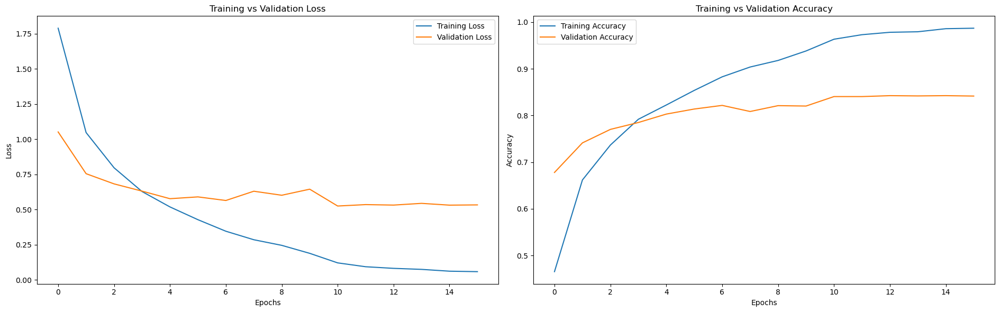

In [17]:
plt.figure(figsize=(19, 6))

# Loss
plt.subplot(1, 2, 1)
plt.plot(history.history["loss"], label="Training Loss")
plt.plot(history.history["val_loss"], label="Validation Loss")
plt.title("Training vs Validation Loss")
plt.xlabel("Epochs")
plt.ylabel("Loss")
plt.legend()

# Accuracy
plt.subplot(1, 2, 2)
plt.plot(history.history["accuracy"], label="Training Accuracy")
plt.plot(history.history["val_accuracy"], label="Validation Accuracy")
plt.title("Training vs Validation Accuracy")
plt.xlabel("Epochs")
plt.ylabel("Accuracy")
plt.legend()

plt.tight_layout()
plt.show()

In [19]:
y_true = []
y_pred = []

for images, labels in test_ds:
    preds = model.predict(images)
    preds = np.argmax(preds, axis=1)

    y_true.extend(labels.numpy())
    y_pred.extend(preds)

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 927ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 916ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 939ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 935ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 908ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 902ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 889ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 865ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 930ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 883ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 874ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 841ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 836ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 878ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 882ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 832ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 828ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 832ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 829ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 834ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 860ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 869ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 833ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 834ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 948ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 

In [ ]:
if len(y_true) > 1:
    y_true_fixed = np.argmax(y_true, axis=1)
else:
    y_true_fixed = y_true

print(classification_report(
    y_true_fixed,
    y_pred,
    target_names=class_names
))

                           precision    recall  f1-score   support

       Cashew anthracnose       0.92      0.83      0.87       260
           Cashew gumosis       1.00      0.97      0.98        60
           Cashew healthy       0.91      0.96      0.93       206
        Cashew leaf miner       0.87      0.89      0.88       208
          Cashew red rust       0.98      0.96      0.97       253
 Cassava bacterial blight       0.85      0.90      0.87       390
       Cassava brown spot       0.82      0.83      0.83       221
       Cassava green mite       0.82      0.87      0.84       153
          Cassava healthy       0.93      0.90      0.91       180
           Cassava mosaic       0.90      0.90      0.90       168
      Maize fall armyworm       0.84      0.82      0.83        44
         Maize grasshoper       0.98      0.82      0.89       102
            Maize healthy       0.70      0.52      0.59        31
        Maize leaf beetle       0.88      0.96      0.92     

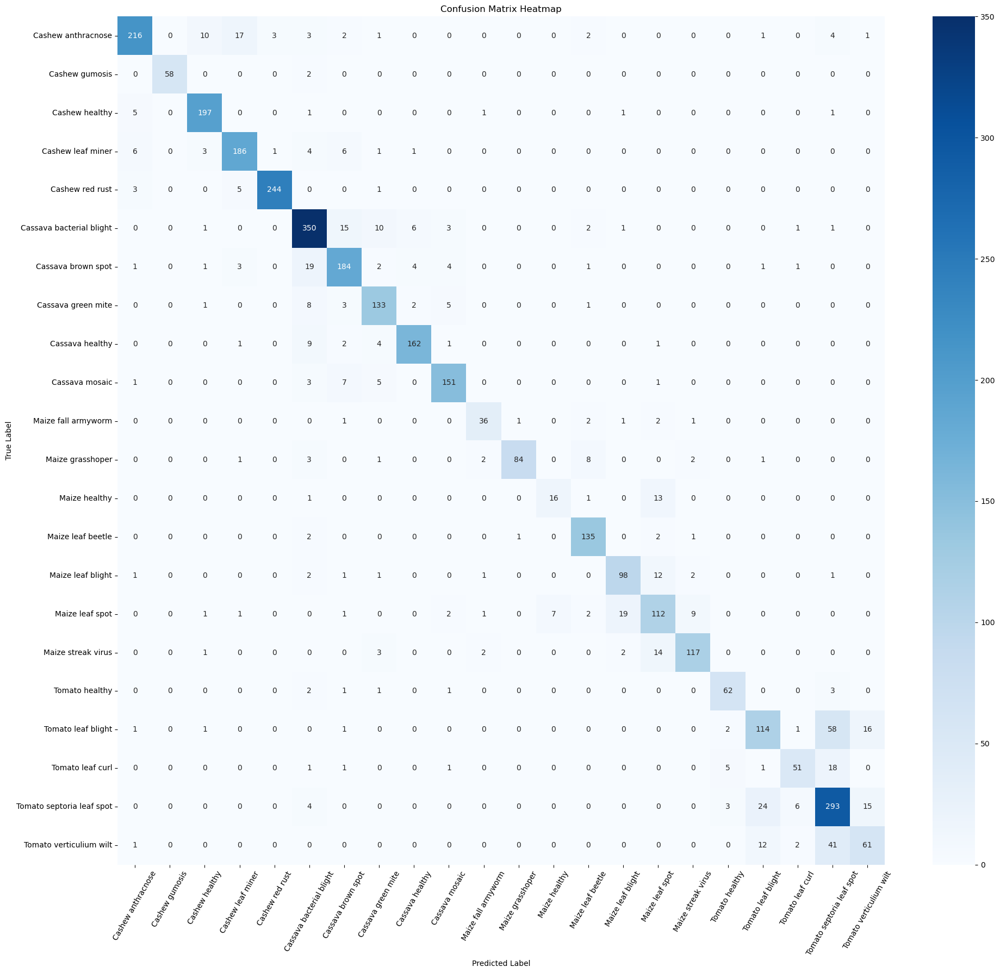

In [ ]:
if len(y_true) > 1:
    y_true_fixed = np.argmax(y_true, axis=1)
else:
    y_true_fixed = y_true

cm = confusion_matrix(y_true_fixed, y_pred)

plt.figure(figsize=(20, 18))
sns.heatmap(
    cm,
    annot=True,
    fmt="d",
    cmap="Blues",
    xticklabels=class_names,
    yticklabels=class_names
)
plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.title("Confusion Matrix Heatmap")
plt.xticks(rotation=60)
plt.yticks(rotation=0)
plt.tight_layout()
plt.show()

# Save Model

In [31]:
model.save("densenet121_model.h5")
print("Model saved as 'densenet121_model.h5'")

Model saved as 'densenet121_model.h5'


### Test Load Model

In [32]:
loaded_model = tf.keras.models.load_model("densenet121_model.h5")
print("Model loaded successfully!")

Model loaded successfully!


In [33]:
test_loss, test_acc = loaded_model.evaluate(test_ds)

print("Test Loss (Loaded Model):", test_loss)
print("Test Accuracy (Loaded Model):", test_acc)

114/114 ━━━━━━━━━━━━━━━━━━━━ 99s 829ms/step - accuracy: 0.8420 - loss: 0.5354
Test Loss (Loaded Model): 0.5354491472244263
Test Accuracy (Loaded Model): 0.8420473337173462
